In [1]:
import scanpy as sc
import pandas as pd

import matplotlib.pyplot as plt

import seaborn as sns

import squidpy as sq

import celltypist
from celltypist import models

from matplotlib import rcParams

In [2]:
pd.set_option('display.max_rows', 100)

In [3]:
# input
sample = "0043587_adjacent"

# Load Xenium data

In [4]:
adata = sc.read_10x_h5("data/" + sample + "/cell_feature_matrix.h5")

In [5]:
adata

AnnData object with n_obs × n_vars = 49032 × 5001
    var: 'gene_ids', 'feature_types', 'genome'

In [6]:
print(adata.X[1:20, 1:20])

  (0, 0)	1.0
  (0, 5)	1.0
  (6, 2)	1.0
  (6, 11)	1.0
  (7, 18)	2.0
  (9, 3)	1.0
  (11, 11)	1.0
  (12, 4)	1.0
  (16, 3)	1.0
  (16, 5)	2.0


## Add cell data

In [7]:
cells = pd.read_csv("data/" + sample + "/cells.csv.gz")

# Set indext to barcode
cells.index = cells.cell_id

cells

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method
cell_id,,,,,,,,,,,,,,
aaacjeae-1,aaacjeae-1,1190.987305,30.263050,107,0,0,0,0,0,107,56.942033,24.926251,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaaeicpf-1,aaaeicpf-1,1166.150391,357.513092,1324,0,0,0,0,0,1324,158.092037,89.364222,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaafeaip-1,aaafeaip-1,1258.588989,9.453443,97,0,0,0,0,0,97,30.751407,13.411407,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaagdiga-1,aaagdiga-1,1210.304443,315.700836,174,0,0,0,0,0,174,28.719376,15.985313,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
aaagglie-1,aaagglie-1,1283.375122,245.926453,30,0,0,0,0,0,30,31.293282,6.954063,2,Segmented by boundary stain (ATP1A1+CD45+E-Cad...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
oilfkggl-1,oilfkggl-1,3027.420898,1025.926270,2,0,0,0,0,0,2,14.314532,8.534532,1,Segmented by nucleus expansion of 5.0µm
oilfljpo-1,oilfljpo-1,3024.534180,1034.035767,4,0,0,0,0,0,4,8.037813,8.037813,1,Segmented by nucleus expansion of 5.0µm
oilgfndf-1,oilgfndf-1,3150.515869,1225.930542,11,0,0,0,0,0,11,15.127344,11.921250,1,Segmented by nucleus expansion of 5.0µm


In [8]:
cells = cells.drop(columns='total_counts')  # included in QC calculation below

In [9]:
adata.obs = adata.obs.join(cells, how='left')

In [10]:
adata.obs['sample'] = sample

## Load previous clustering

In [11]:
clust = pd.read_csv("data/" + sample + "/analysis/clustering/gene_expression_graphclust/clusters.csv") 

In [12]:
clust.index = clust.Barcode
clust = clust.drop("Barcode", axis=1)
clust = clust.rename(columns={"Cluster": "graphclust"})

In [13]:
clust

,graphclust
Barcode,
aaacjeae-1,14
aaaeicpf-1,14
aaafeaip-1,19
aaagdiga-1,14
aaagglie-1,13
...,...
oilfahhm-1,13
oilfkggl-1,4
oilfljpo-1,4


In [14]:
clust.graphclust = clust.graphclust.astype(str)
categories = sorted(clust.graphclust.unique(), key=int)
clust.graphclust = pd.Categorical(clust.graphclust, categories=categories, ordered=True)
clust.graphclust

Barcode
aaacjeae-1    14
aaaeicpf-1    14
aaafeaip-1    19
aaagdiga-1    14
aaagglie-1    13
              ..
oilfahhm-1    13
oilfkggl-1     4
oilfljpo-1     4
oilgfndf-1     4
oilhaolb-1     4
Name: graphclust, Length: 48824, dtype: category
Categories (21, object): ['1' < '2' < '3' < '4' ... '18' < '19' < '20' < '21']

In [15]:
#clust.graphclust = clust.graphclust.astype('int').astype('str').astype('category')
#clust.graphclust = clust.graphclust.astype('category')
#clust.graphclust = clust.graphclust.astype('object').astype('category')

In [16]:
#adata.obs = adata.obs.drop('graphclust', axis=1)

In [17]:
adata.obs = adata.obs.join(clust, how='left')

# Load CellTypist models

In [18]:
# Load celltypist models of fibroblasts from Friedrich (our) study
model_fibro = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/friedrich_fibroblasts.pkl")

In [19]:
models.download_models(force_update = True)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 52
📂 Storing models in /home/jovyan/.celltypist/data/models
💾 Downloading model [1/52]: Immune_All_Low.pkl
💾 Downloading model [2/52]: Immune_All_High.pkl
💾 Downloading model [3/52]: Adult_COVID19_PBMC.pkl
💾 Downloading model [4/52]: Adult_CynomolgusMacaque_Hippocampus.pkl
💾 Downloading model [5/52]: Adult_Human_MTG.pkl
💾 Downloading model [6/52]: Adult_Human_PancreaticIslet.pkl
💾 Downloading model [7/52]: Adult_Human_PrefrontalCortex.pkl
💾 Downloading model [8/52]: Adult_Human_Skin.pkl
💾 Downloading model [9/52]: Adult_Mouse_Gut.pkl
💾 Downloading model [10/52]: Adult_Mouse_OlfactoryBulb.pkl
💾 Downloading model [11/52]: Adult_Pig_Hippocampus.pkl
💾 Downloading model [12/52]: Adult_RhesusMacaque_Hippocampus.pkl
💾 Downloading model [13/52]: Autopsy_COVID19_Lung.pkl
💾 Downloading model [14/52]: COVID19_HumanChallenge_Blood.pkl
💾 Downloading model [15/52]: COVID19_Immune_Landsc

In [20]:
#models.models_description()

In [21]:
# Elmentaite gut model
#model_gi = models.Model.load(model = 'Cells_Intestinal_Tract.pkl')

# Load healthy megagut CellTypist model
#model_megagut = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/1_full_healthy_reference_all_ages_organs_finalmodel.pkl")
#model_megagut = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/1_full_healthy_reference_all_ages_organs_allgenes.pkl")

In [22]:
#model_megagut.cell_types

In [23]:
# Healthy megagut models
#model_megagutSmallIntestine = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/8_healthy_reference_AP_small_intestine_allgenes.pkl")
#model_megagutLargeIntestine = models.Model.load("/nfs/team205/ao15/Megagut/Annotations_v3/make_celltypist_models/models/9_healthy_reference_AP_large_intestine_allgenes.pkl")

In [24]:
# Healthy + disease megagut levels at 3 levels
model_megagutSmallIntestineDisease_lvl1 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl1.pkl")

In [25]:
model_megagutSmallIntestineDisease_lvl1

CellTypist model with 7 cell types and 34645 features
    date: 2024-08-28 02:00:11.200958
    cell types: B and B plasma, Endothelial, ..., T and NK cells
    features: MIR1302-2HG, OR4F5, ..., AC007325.2

In [26]:
model_megagutSmallIntestineDisease_lvl3 = models.Model.load("../fibroblast_reanalysis_celltypist/celltypist/megagutSmallIntestine_lvl3.pkl")

In [27]:
model_megagutSmallIntestineDisease_lvl3

CellTypist model with 105 cell types and 34645 features
    date: 2024-09-09 19:43:40.301080
    cell types: Angiogenic_pericyte, BEST4_enterocyte_colonocyte, ..., gdT_naive
    features: MIR1302-2HG, OR4F5, ..., AC007325.2

# Process data

In [28]:
# QC metrics
sc.pp.calculate_qc_metrics(adata, percent_top=(10, 20, 50, 150), inplace=True)


<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

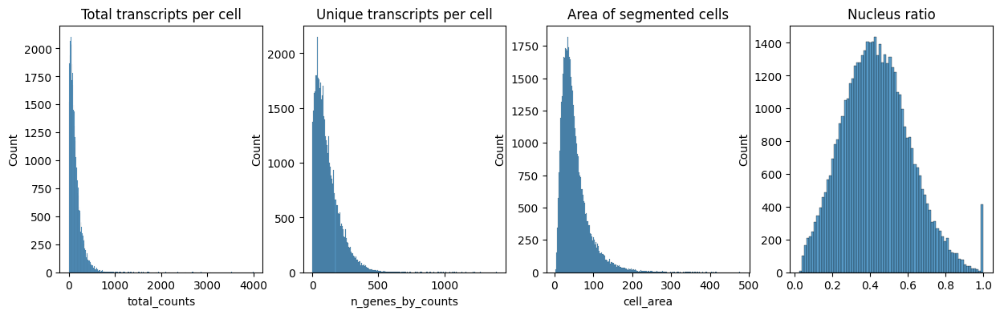

In [29]:
# Plot histograms
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

In [30]:
adata

AnnData object with n_obs × n_vars = 49032 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [31]:
# Filter out cells with fewer than specified reads
sc.pp.filter_cells(adata, min_counts=5)

In [32]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [33]:
adata.layers["counts"] = adata.X.copy()  # store raw counts

In [34]:
# Normalize according to CellTypist requirement
sc.pp.normalize_per_cell(adata, counts_per_cell_after=10000)

# Pseudo log transform
sc.pp.log1p(adata)

In [35]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)

In [36]:
# UMAP
sc.tl.umap(adata)

In [37]:
# Clustering
sc.tl.leiden(adata)

IOStream.flush timed out


In [38]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# CellTypist predictions

## Run CellTypist for each model

In [39]:
# Run celltypist on data, healthy only
# 1h runtime for 250k cells
predictions_megagutSmall = celltypist.annotate(
    adata,
    model = model_megagutSmallIntestineDisease_lvl3,
    majority_voting = True,
    mode = 'best match',
)

🔬 Input data has 48133 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 4985 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [40]:
adata = predictions_megagutSmall.to_adata(prefix='megagut_lvl3_')

In [41]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'd

In [42]:
# Run celltypist on data, healthy+diseased, small intestine, level1 broad annotation
predictions_megagutSmall = celltypist.annotate(
    adata,
    model = model_megagutSmallIntestineDisease_lvl1,
    majority_voting = True,
    mode = 'best match',
)

🔬 Input data has 48133 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 4985 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [43]:
adata = predictions_megagutSmall.to_adata(prefix='megagut_lvl1_')

In [44]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns:

## Visualize CellTypist predictions

In [45]:
# conf_thresh = 0.2
# prefix = "Elmentaite_"

In [46]:
# sort predicted cell types by mean confidence score from CellTypist
def sortCellTypistConfScore(adata, prefix):
    mean_conf = adata.obs.groupby(
        adata.obs[prefix + 'majority_voting'])[[prefix + 'conf_score']] \
        .mean() \
        .sort_values(by=prefix + "conf_score", ascending=False)
    return(mean_conf)


# Adds new prefix + 'majority_voting_conf' column to adata.obs containing cell types
def filterCellTypistMajorityVoting(adata, prefix, mean_conf, conf_thresh):
    # Add new column
    adata.obs[prefix + 'majority_voting_conf'] = adata.obs[prefix + 'majority_voting']
    
    # Filter out low confidence prediction labels
    exclude_cell_types = mean_conf.index[mean_conf.iloc[:, 0] < conf_thresh]
    adata.obs[prefix + 'majority_voting_conf'][adata.obs[prefix + 'majority_voting_conf'].isin(exclude_cell_types)] = pd.NA
    
    adata.obs[prefix + 'majority_voting_conf'] = adata.obs[prefix + 'majority_voting_conf'].cat.remove_unused_categories()
    
    return(adata)

In [47]:
# mean_conf = sortCellTypistConfScore(adata, "Elmentaite_")
# mean_conf

In [48]:
# rcParams["figure.figsize"] = (10, 4)
# sc.pl.violin(adata, prefix + "conf_score", groupby= prefix + "majority_voting", rotation=90, order=mean_conf.index, stripplot=False, inner="box")

In [49]:
#adata.obs = adata.obs.drop(columns="Elmentaite_majority_voting_conf")

In [50]:
# # add column to obs
# adata = filterCellTypistMajorityVoting(adata, prefix, mean_conf, conf_thresh)

In [51]:
# adata

In [52]:
# prefix = "megagut_"

# mean_conf = sortCellTypistConfScore(adata, prefix)
# mean_conf

In [53]:
# rcParams["figure.figsize"] = (7, 4)
# sc.pl.violin(adata, prefix + "conf_score", groupby=prefix + "majority_voting", rotation=90, order=mean_conf.index, stripplot=False, inner="box")

In [54]:
# adata = filterCellTypistMajorityVoting(adata, prefix, mean_conf, 0.1)

In [55]:
# sc.pl.umap(
#     adata,
#     color=[
#         "leiden",
#         #"megagut_conf_score",
#         "megagut_majority_voting",
#         #"megagut_majority_voting_conf"
#     ],
#     wspace=0.5,
# )

In [56]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns:

... storing 'segmentation_method' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


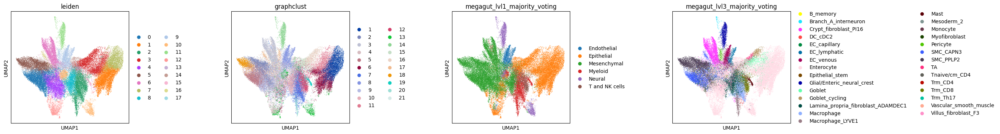

In [57]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "leiden", "graphclust", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", 
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

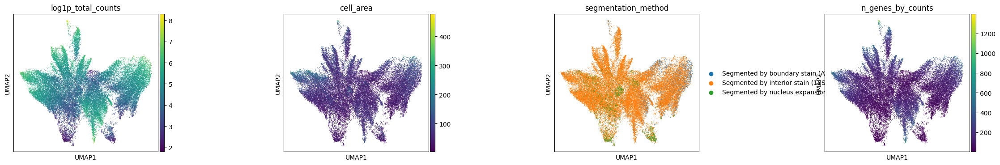

In [58]:
# Technical plots
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
        "log1p_total_counts", "cell_area", "segmentation_method", "n_genes_by_counts"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

<Axes: xlabel='graphclust', ylabel='megagut_lvl3_majority_voting'>

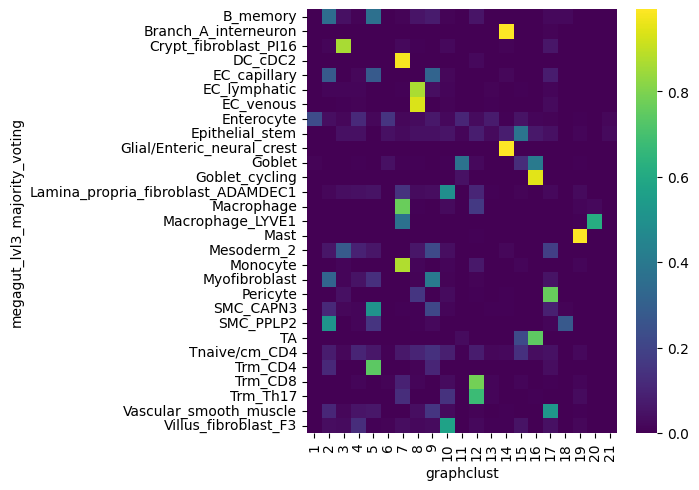

In [59]:
conf_mat = sc.metrics.confusion_matrix("megagut_lvl3_majority_voting", "graphclust", adata.obs)
rcParams['figure.figsize'] = 5, 5.5
#sns.clustermap(
sns.heatmap(
    conf_mat,
    xticklabels=True,
    yticklabels=True,
    cmap='viridis'
)

<Axes: xlabel='leiden', ylabel='megagut_lvl3_majority_voting'>

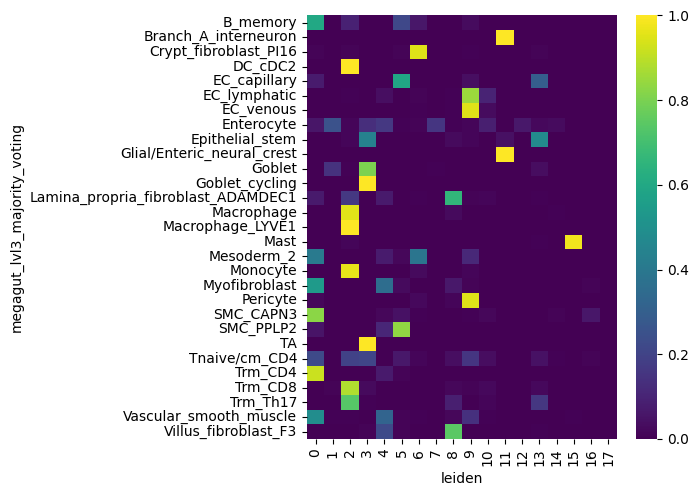

In [60]:
conf_mat = sc.metrics.confusion_matrix("megagut_lvl3_majority_voting", "leiden", adata.obs)
rcParams['figure.figsize'] = 5, 5.5
#sns.clustermap(
sns.heatmap(
    conf_mat,
    xticklabels=True,
    yticklabels=True,
    cmap='viridis'
)

In [61]:
#adata.obs.megagut_lvl3_majority_voting.value_counts()

<Axes: xlabel='megagut_lvl3_majority_voting'>

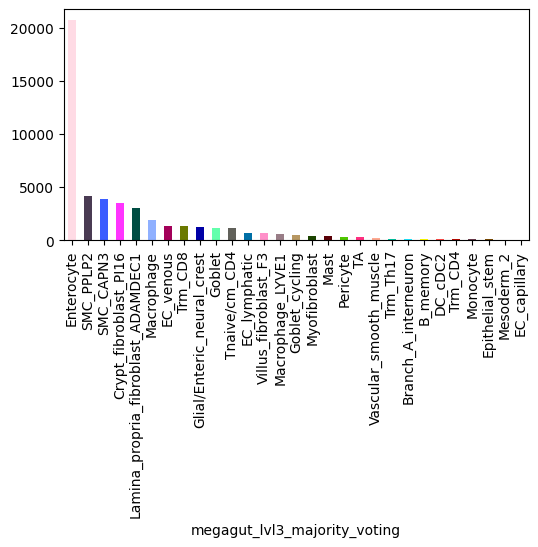

In [62]:
# Barplot of numbers of cells
rcParams["figure.figsize"] = (6, 3)

# Get color dictionary based on previous colors
color_dict = dict(zip(adata.obs.megagut_lvl3_majority_voting.cat.categories, adata.uns['megagut_lvl3_majority_voting_colors']))

values = adata.obs.megagut_lvl3_majority_voting.value_counts()
values.plot.bar(color=values.index.map(color_dict))

## Marker plots for label transfer

In [63]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

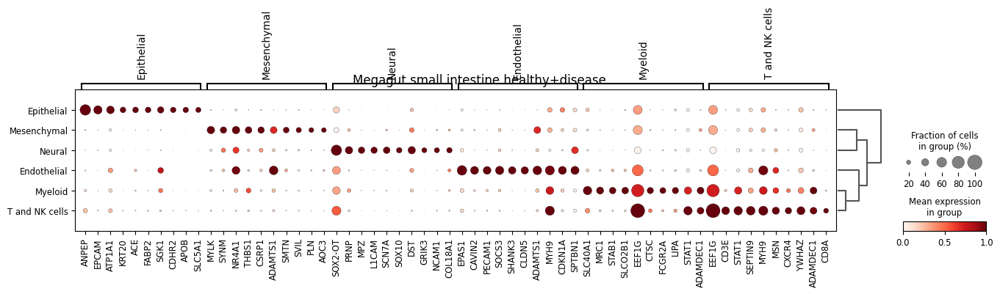

In [64]:
# Investigate markers of CellTypist labels
sc.tl.rank_genes_groups(adata, groupby='megagut_lvl1_majority_voting', method='wilcoxon')

sc.pl.rank_genes_groups_dotplot(
    adata, groupby='megagut_lvl1_majority_voting', standard_scale="var", n_genes=10, title="Megagut small intestine healthy+disease", figsize=(16, 2.5)
)

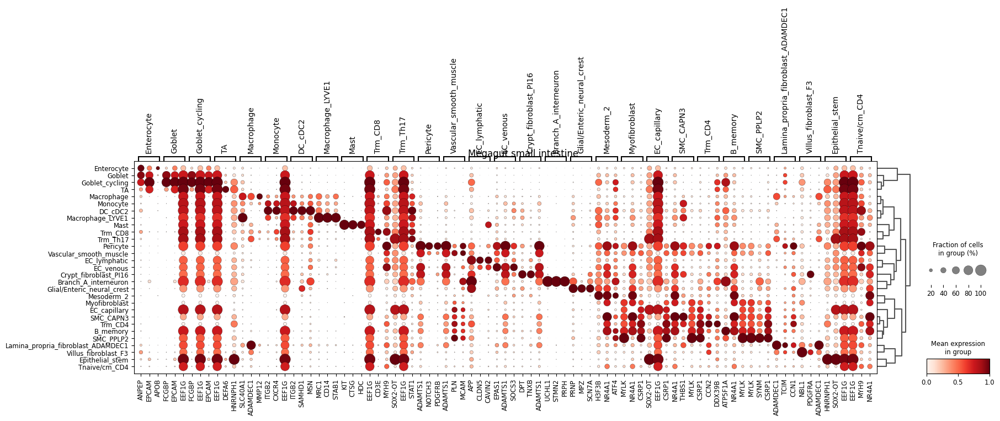

In [65]:
# Investigate markers of CellTypist labels
sc.tl.rank_genes_groups(adata, groupby='megagut_lvl3_majority_voting', method='wilcoxon')

sc.pl.rank_genes_groups_dotplot(
    adata, groupby='megagut_lvl3_majority_voting', standard_scale="var", n_genes=3, title="Megagut small intestine", figsize=(20, 5)
)

In [66]:
adata.obs.megagut_lvl3_majority_voting.value_counts()

megagut_lvl3_majority_voting
Enterocyte                            20733
SMC_PPLP2                              4193
SMC_CAPN3                              3860
Crypt_fibroblast_PI16                  3489
Lamina_propria_fibroblast_ADAMDEC1     3050
Macrophage                             1875
EC_venous                              1332
Trm_CD8                                1288
Glial/Enteric_neural_crest             1276
Goblet                                 1175
Tnaive/cm_CD4                          1126
EC_lymphatic                            688
Villus_fibroblast_F3                    666
Macrophage_LYVE1                        619
Goblet_cycling                          470
Myofibroblast                           384
Mast                                    380
Pericyte                                304
TA                                      266
Vascular_smooth_muscle                  185
Trm_Th17                                133
Branch_A_interneuron                     98
B_m

In [67]:
# # Plot marker expression of top-5 markers
# rcParams["figure.figsize"] = (2.5, 2.5)
# sc.pl.umap(
#     adata,
#     color=[*sc.get.rank_genes_groups_df(adata, group="Crypt_fibroblast_PI16").head(8)['names'], "leiden"],
#     legend_loc="on data",
#     frameon=False,
#     ncols=3,
# )

## Run CellTypist with fibroblast model

In [68]:
# Run celltypist on data
predictions = celltypist.annotate(
    adata,
    model = model_fibro,
    majority_voting = True,
    mode = 'prob match',
    p_thres = 0.5)

🔬 Input data has 48133 cells and 5001 genes
🔗 Matching reference genes in the model
🧬 529 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 20
🗳️ Majority voting the predictions
✅ Majority voting done!


In [69]:
predictions

CellTypist prediction result for 48133 query cells
    predicted_labels: data frame with 3 columns ('predicted_labels', 'over_clustering', 'majority_voting')
    decision_matrix: data frame with 48133 query cells and 9 cell types
    probability_matrix: data frame with 48133 query cells and 9 cell types
    adata: AnnData object referred

In [70]:
# Add celltypist results to AnnData object
# Columns: 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5'
adata = predictions.to_adata(insert_prob=True)

In [71]:
# rename probability columns
subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

adata.obs = adata.obs.rename(columns={x: x + "_prob" for x in subtypes})

In [72]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

In [73]:
adata.obs.majority_voting.value_counts()

majority_voting
Unassigned    45293
S3             1049
S3x             668
S1              448
PC              419
S2              256
Name: count, dtype: int64

In [74]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

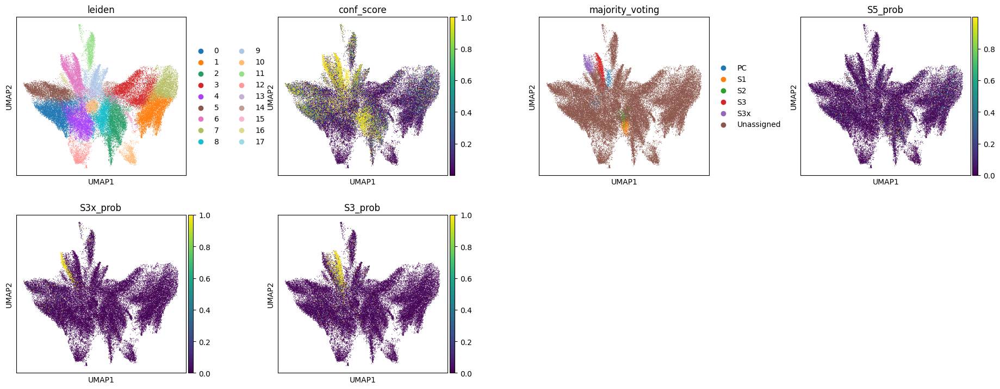

In [77]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata,
    color=[
#        "n_genes_by_counts",
#        "log1p_total_counts",
        "leiden",
        "conf_score",
        "majority_voting",
        "S5_prob", "S3x_prob", "S3_prob"
    ],
    wspace=0.4,
)

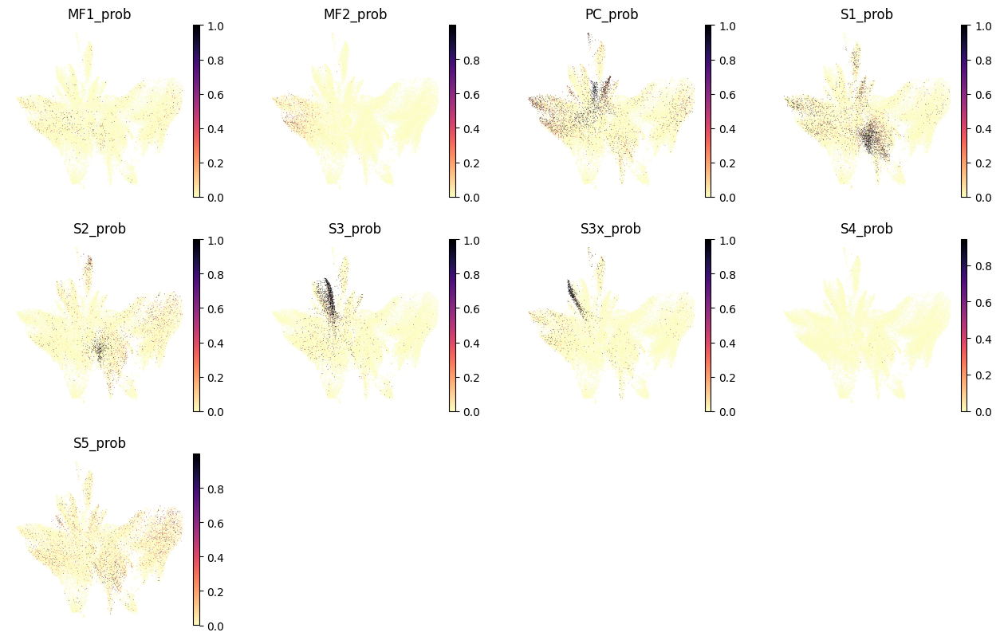

In [78]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)
sc.pl.umap(adata, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

## Map S5 cells to megagut label transfer

Text(0, 0.5, 'S5 cells')

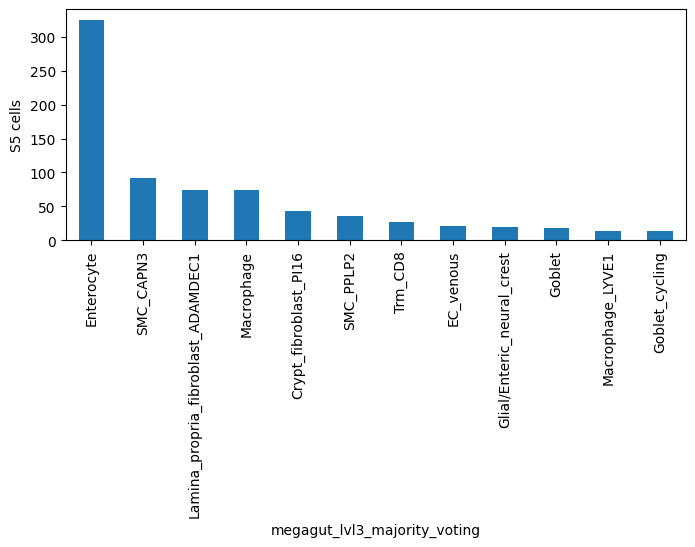

In [79]:
# Megagut healthy
rcParams["figure.figsize"] = (8, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

Text(0, 0.5, 'S5 cells')

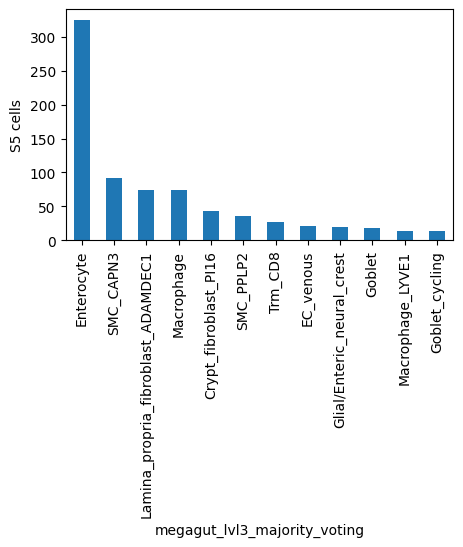

In [80]:
# Megagut healthy small intestine
rcParams["figure.figsize"] = (5, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

Text(0, 0.5, 'S5 cells')

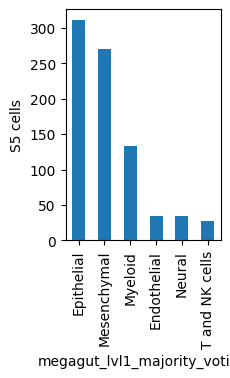

In [81]:
# Megagut small intestine healthy and disease, level 1 annotation
rcParams["figure.figsize"] = (2, 3)

values = adata.obs.megagut_lvl1_majority_voting[adata.obs.S5_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S5 cells")

## Other fibroblast subtypes

Text(0, 0.5, 'S3x cells')

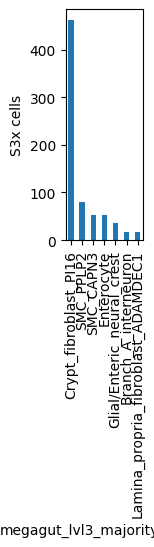

In [82]:
# S3x
rcParams["figure.figsize"] = (1, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S3x_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S3x cells")

Text(0, 0.5, 'S3 cells')

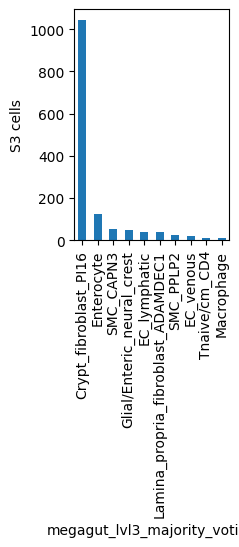

In [83]:
# S3
rcParams["figure.figsize"] = (2, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S3_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S3 cells")

Text(0, 0.5, 'S1 cells')

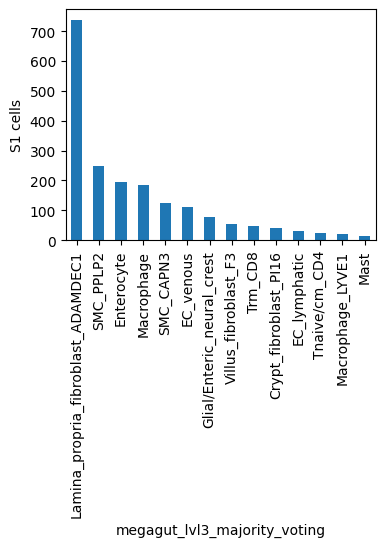

In [84]:
# S1
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.S1_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("S1 cells")

Text(0, 0.5, 'MF1 cells')

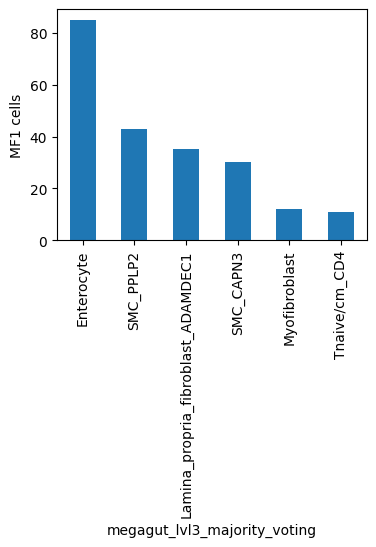

In [85]:
# Myofibroblasts
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.MF1_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("MF1 cells")

Text(0, 0.5, 'PC cells')

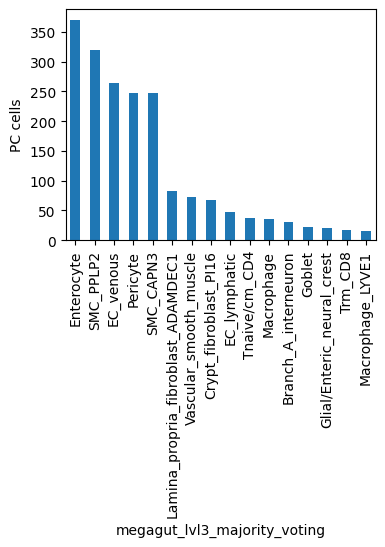

In [86]:
# Pericytes
rcParams["figure.figsize"] = (4, 3)

values = adata.obs.megagut_lvl3_majority_voting[adata.obs.PC_prob > 0.5].value_counts()

values = values[values > 10]
values.plot.bar().set_ylabel("PC cells")

## Mesenchymal subset

In [87]:
# Mesenchymal subset
adata_mesen = adata[adata.obs.megagut_lvl1_majority_voting == 'Mesenchymal']

In [88]:
adata_mesen

View of AnnData object with n_obs × n_vars = 20759 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5

In [89]:
#adata_mesen.obs.join(predictions.predicted_labels, rsuffix="_fibro")

In [90]:
# Recompute dimensionality reduction across samples
sc.pp.pca(adata_mesen)
sc.pp.neighbors(adata_mesen)

In [91]:
# UMAP
sc.tl.umap(adata_mesen)

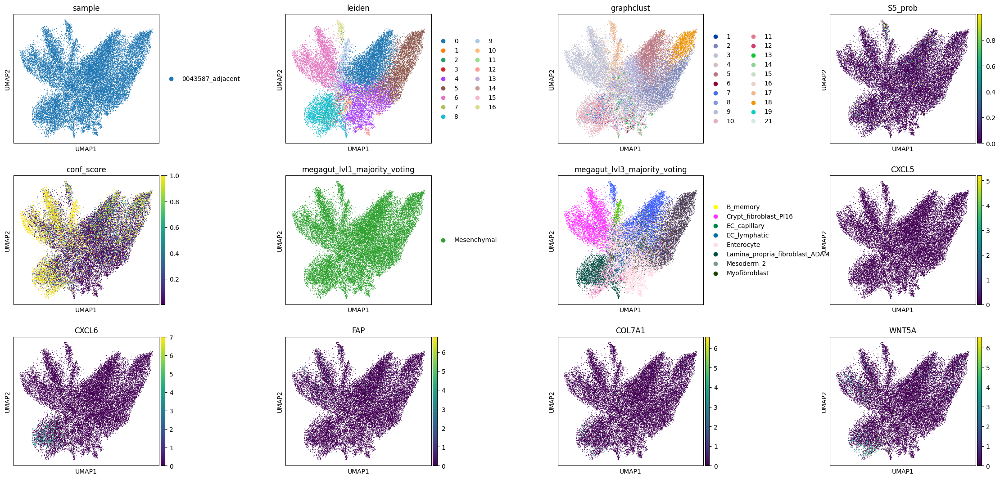

In [92]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen,
    color=[
        "sample", "leiden", "graphclust", "S5_prob", "conf_score", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", "CXCL5", "CXCL6", "FAP", "COL7A1", "WNT5A"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

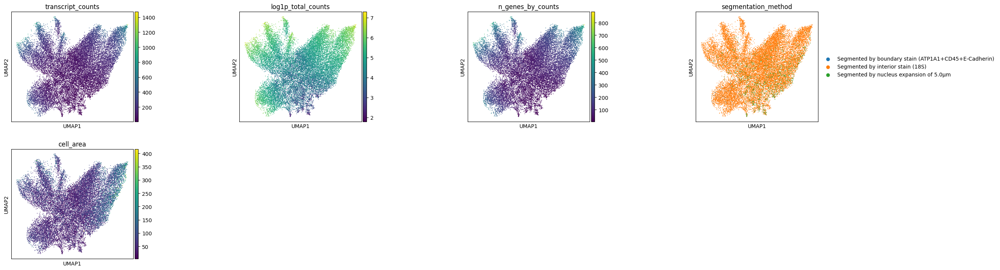

In [93]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen,
    color=[
        "transcript_counts", "log1p_total_counts", "n_genes_by_counts", "segmentation_method", "cell_area"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

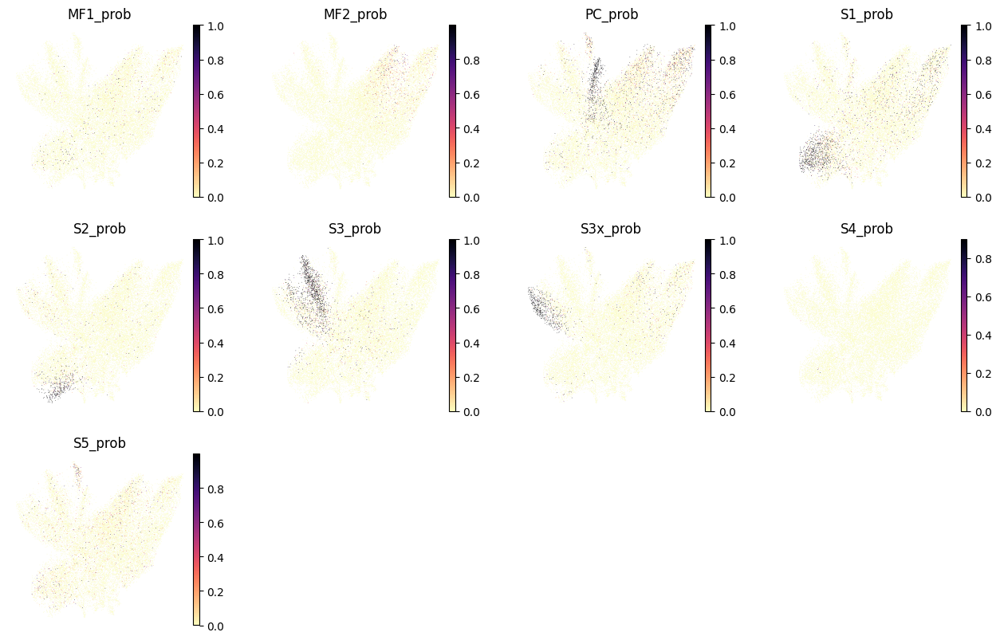

In [94]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)

subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

sc.pl.umap(adata_mesen, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

### Filter mesenchymal cells

In [96]:
# Mesenchymal subset
adata_mesen_subset = adata_mesen.copy()

In [97]:
# More stringent filter on counts
sc.pp.filter_cells(adata_mesen_subset, min_counts=200)

In [98]:
adata_mesen_subset

AnnData object with n_obs × n_vars = 17919 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

In [99]:
adata_mesen_subset.obs.megagut_lvl3_majority_voting.value_counts()

megagut_lvl3_majority_voting
SMC_PPLP2                             3998
SMC_CAPN3                             3664
Crypt_fibroblast_PI16                 3346
Enterocyte                            2491
Lamina_propria_fibroblast_ADAMDEC1    2233
Villus_fibroblast_F3                   541
Tnaive/cm_CD4                          514
Myofibroblast                          319
Pericyte                               304
Vascular_smooth_muscle                 171
Trm_CD4                                 89
B_memory                                87
EC_lymphatic                            67
EC_capillary                            51
Mesoderm_2                              44
Name: count, dtype: int64

In [100]:
exclude_cells = ["Enterocyte", "Tnaive/cm_CD4", "B_memory", "Glial/Enteric_neural_crest", "Trm_CD8"]

adata_mesen_subset = adata_mesen_subset[~adata_mesen_subset.obs.megagut_lvl3_majority_voting.isin(exclude_cells)]

In [101]:
adata_mesen_subset

View of AnnData object with n_obs × n_vars = 14827 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5

In [102]:
# Recompute dimensionality reduction across samples
sc.pp.pca(adata_mesen_subset)
sc.pp.neighbors(adata_mesen_subset)

In [103]:
# UMAP
sc.tl.umap(adata_mesen_subset)

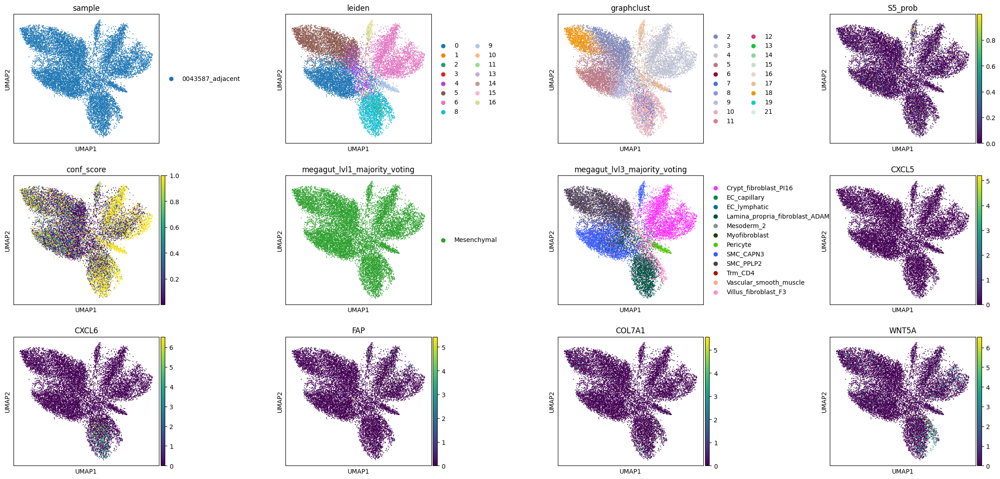

In [104]:
rcParams["figure.figsize"] = (4, 4)

sc.pl.umap(
    adata_mesen_subset,
    color=[
        "sample", "leiden", "graphclust", "S5_prob", "conf_score", "megagut_lvl1_majority_voting", "megagut_lvl3_majority_voting", "CXCL5", "CXCL6", "FAP", "COL7A1", "WNT5A"
    ],
    wspace=0.7,
    #palette=sc.pl.palettes.default_28
    #palette=sc.pl.palettes.default_102
    #palette=sc.pl.palettes.vega_20_scanpy
)

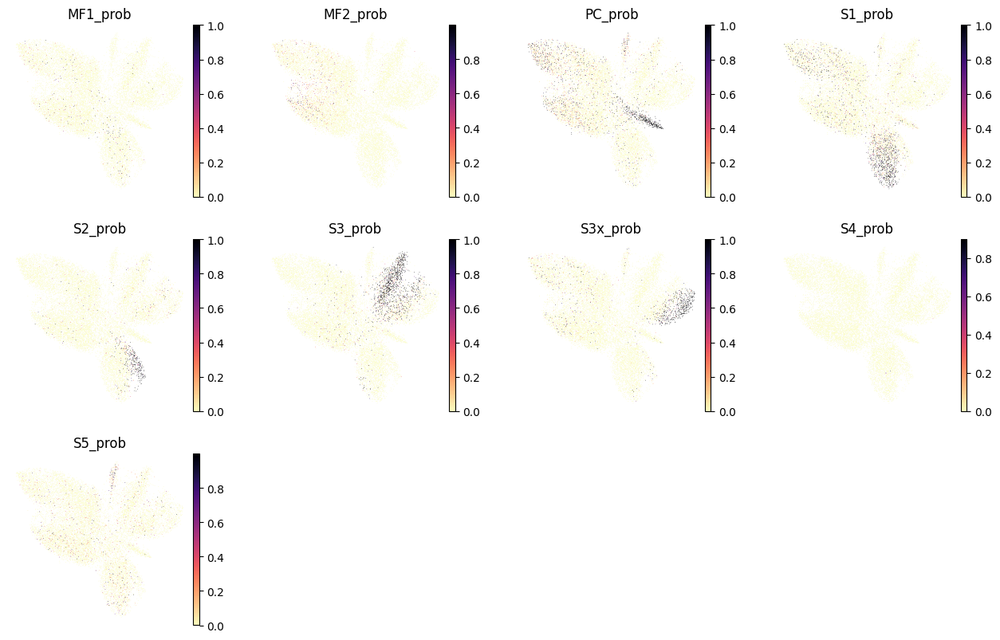

In [105]:
# Plots of all posterior probabilityes per fibroblast sybtype
rcParams["figure.figsize"] = (3, 3)

subtypes = ['MF1', 'MF2', 'PC', 'S1', 'S2', 'S3', 'S3x', 'S4', 'S5']

sc.pl.umap(adata_mesen_subset, color=[x + "_prob" for x in subtypes], color_map="magma_r", frameon=False, size=1,
           #save="_megagut_fibro_celltypist_probs"
)

# Spatial plots

In [106]:
adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()

In [107]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

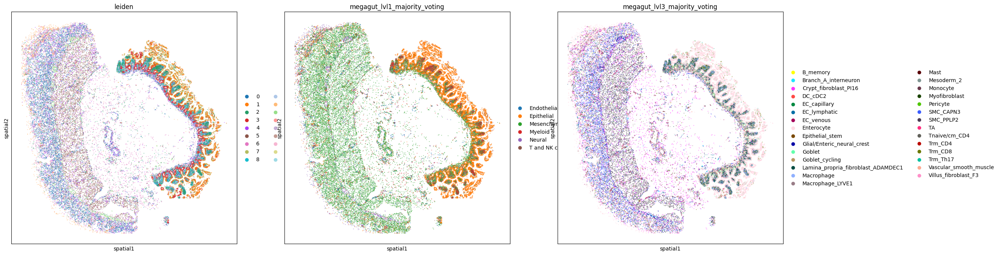

In [108]:
# Megagut small intestine
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl1_majority_voting",
        "megagut_lvl3_majority_voting"],  # healthy only
    wspace=0.1,
    size=0.1,
    figsize=(8, 8),
    na_color="lightgrey"
)

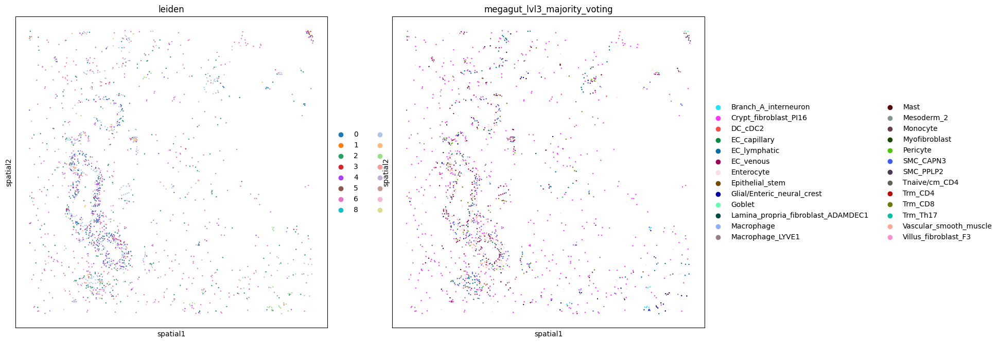

In [109]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl3_majority_voting"],
    wspace=0.1,
    size=1.0,
    figsize=(8, 8),
    na_color="lightgrey",
    crop_coord=(1500, 1500, 3000, 3000)
)

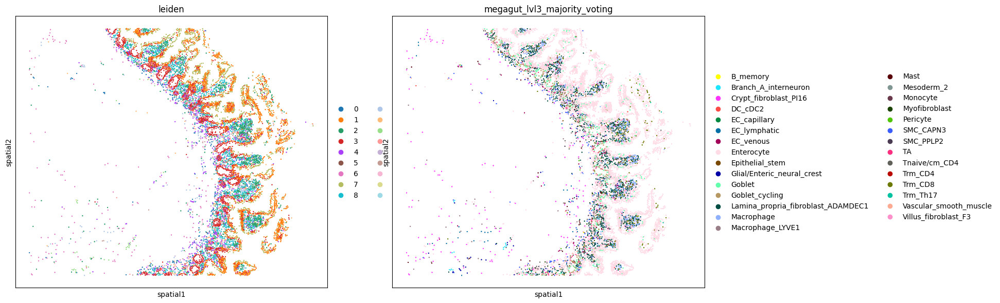

In [110]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
        "megagut_lvl3_majority_voting"],
    wspace=0.1,
    size=1.0,
    figsize=(8, 8),
    na_color="lightgrey",
    crop_coord=(2500, 1500, 5000, 3000)
)

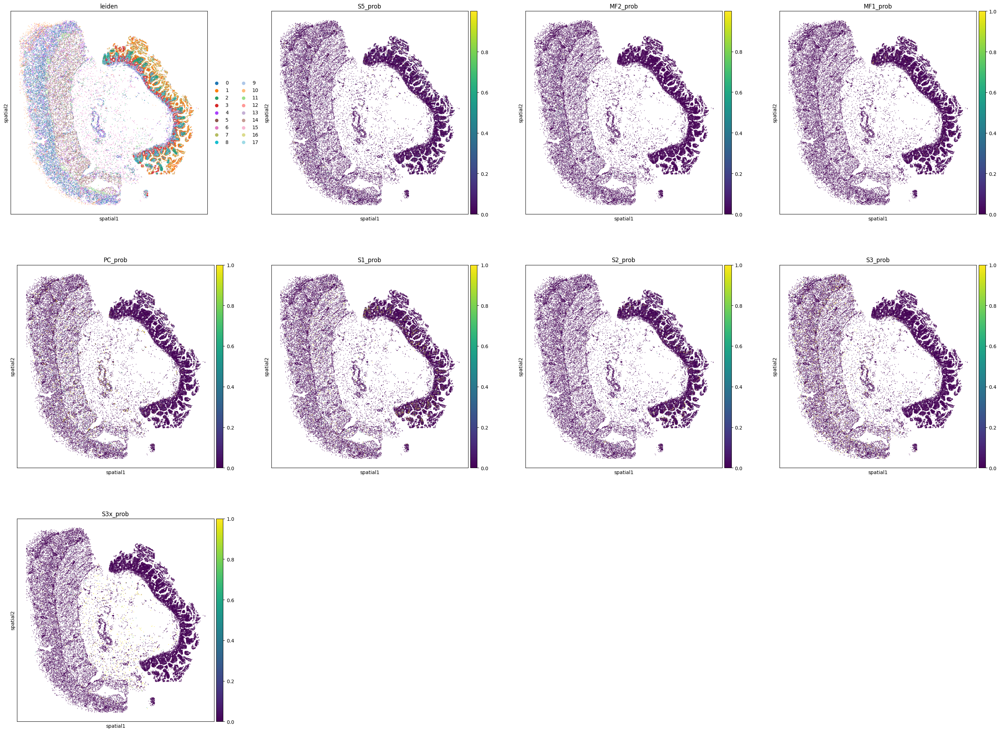

In [111]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden", "S5_prob", "MF2_prob", "MF1_prob", "PC_prob", "S1_prob",  "S2_prob",  "S3_prob",  "S3x_prob", 
    ],
    wspace=0.1,
    size=0.1,
    figsize=(8,8)
)

In [112]:
adata

AnnData object with n_obs × n_vars = 48133 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'sample', 'graphclust', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'leiden', 'megagut_lvl3_predicted_labels', 'megagut_lvl3_over_clustering', 'megagut_lvl3_majority_voting', 'megagut_lvl3_conf_score', 'megagut_lvl1_predicted_labels', 'megagut_lvl1_over_clustering', 'megagut_lvl1_majority_voting', 'megagut_lvl1_conf_score', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'MF1_prob', 'MF2_prob', 'PC_prob', 'S1_prob', 'S2_prob', 'S3_prob', 'S3x_prob', 'S4_prob', 'S5_prob'
 

In [113]:
# Write to file
adata.write_h5ad("h5ad/" + sample + ".h5ad")